## Gradient Method

The key idea behind the gradient method is that for any differentiable function $C(\textbf{W}) \in \mathbb{R}^N\rightarrow\mathbb{R}$, its first derivative is equal to zero at local minimums/maximums. To find a local minimum $\textbf{W}_{minimum} \in \mathbb{R}^N$, we can iteratively move opposite to the direction of the first derivative until the derivative is equal to zero.

$$ \textbf{W}_{t+1} = \textbf{W}_{t} - \alpha \nabla_{\textbf{W}_{t}} $$

$$ \nabla_{\textbf{W}_t} = \frac{\partial C(\textbf{W}_t)}{\partial \textbf{W}_t} $$

Here, $\alpha \in \mathbb{R}$ is the learning rate, which determines the ratio between the magnitude of the derivative at $ \textbf{W}_{t}$ and the magnitude of the jump from $\textbf{W}_{t}$ to $\textbf{W}_{t+1}$.

### Example 1: Quadratic Function

Given function $\text{Q}(\textbf{X}) \in \mathbb{R}^N \rightarrow \mathbb{R}$ defined as:
$$ \text{Q}(\textbf{X}) = \sum_i^N {x_i^2} $$

And its first derivative $\nabla_{\textbf{X}}{\text{Q}(\textbf{X})} \in \mathbb{R}^N \rightarrow \mathbb{R}^N$ defined as:
$$ \nabla_{\textbf{X}}{\text{Q}(\textbf{X})} = 2\textbf{X} $$

Find $\textbf{X}_{minimum}$ such that $\text{Q}(\textbf{X})$ has the lowest possible value, 
$\textbf{X}_{minimum} = \text{argmin}_\textbf{X}\text{Q}(\textbf{X})$.

In [17]:
import numpy as np

def Q(X: np.array) -> float:
    return np.sum(X**2)

def dQ(X: np.array) -> np.array:
    return 2*X

In [18]:
X1 = np.array([50., 50.])
print(f'X1     = {X1}')
print(f'Q(X1)  = {Q(X1)}')
print(f'dQ(X1) = {dQ(X1)}')

X1     = [50. 50.]
Q(X1)  = 5000.0
dQ(X1) = [100. 100.]


In [19]:
from typing import Callable
import pandas as pd

def gradient_descent(
    start: np.array, 
    derivative: Callable[[np.array], np.array], 
    learning_rate: float, 
    iterations: int
    ):
    
    current = start
    X_current_history = []
    X_gradient_history = []
    
    for i in range(iterations):
        X_current_history.append(current)
        
        gradient = derivative(current)
        step = -learning_rate * gradient
        current = current + step
        
        X_gradient_history.append(gradient)

    X_current_history = np.array(X_current_history)
    X_gradient_history = np.array(X_gradient_history)
    
    history = pd.DataFrame({
        'x0': X_current_history[:, 0],
        'x1': X_current_history[:, 1],
        'dx0': X_gradient_history[:, 0],
        'dx1': X_gradient_history[:, 1],
    })

    return current, history

In [20]:
X_minimal, history = gradient_descent(X1, dQ, 0.1, 20)
print(f'X_minimal = {X_minimal}')
history

X_minimal = [0.57646075 0.57646075]


,x0,x1,dx0,dx1
0,50.000000,50.000000,100.000000,100.000000
1,40.000000,40.000000,80.000000,80.000000
2,32.000000,32.000000,64.000000,64.000000
3,25.600000,25.600000,51.200000,51.200000
4,20.480000,20.480000,40.960000,40.960000
5,16.384000,16.384000,32.768000,32.768000
6,13.107200,13.107200,26.214400,26.214400
7,10.485760,10.485760,20.971520,20.971520
8,8.388608,8.388608,16.777216,16.777216
9,6.710886,6.710886,13.421773,13.421773


In [21]:
from utils.garden import *
%config InlineBackend.figure_format ='retina'

/opt/conda/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/opt/conda/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/opt/conda/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


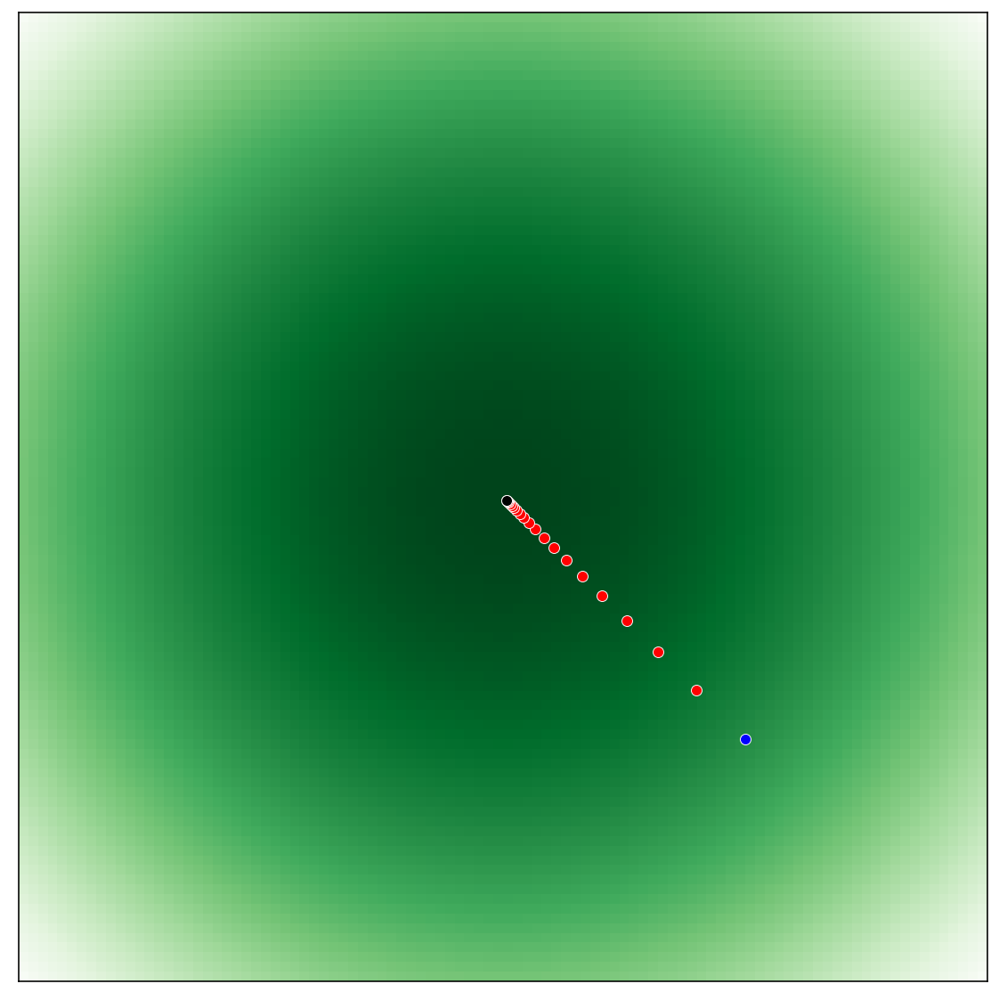

In [22]:
fig = plt.figure(figsize=[10, 10])

plot_field(
    fig=fig,
    field=evaluate_on_square(Q, location=(0,0), side=200),
    location=(0, 0),
    side=200
)

plot_learning_path(
    fig,
    [history.values], 
)

None

### Example 2: Finding gradients with backpropagation

Given a computation graph that evaluates $y$ from $x$, and a particular value $x = x_0$,
the backpropagation algorithm evaluates the value of $\nabla_{x} y(x)$ at point $x_0$.
This calculation is possible for any function using the chain rule.

In Calculus, the chain rule explains how to take derivatives of composite functions. For example, given two functions:

$
f(x) \in \mathbb{R} \rightarrow \mathbb{R} \\
g(x) \in \mathbb{R} \rightarrow \mathbb{R} 
$

What's the derivative of $f(g(x))$?

$$ z = g(x) $$
$$ \frac{\partial f(g(x))}{\partial x} = \frac{\partial f(z)}{\partial z} \frac{\partial g(x)}{\partial x} $$

In the multi-path case:
$$ \frac{\partial f(g_0(x), ..., g_n(x))}{\partial x} = \sum_i^n{\frac{\partial f}{\partial g_i}\frac{\partial g_i}{\partial x}}  $$

Backpropagation is an efficient way to evaluate the value of a function's derivative
at a particular point. Instead of analyzing the function symbolically, we can
calculate derivatives of its components and multiply them together.

In [23]:
import tensorflow as tf

def Qt(X: tf.Tensor) -> tf.Tensor:
    return tf.reduce_sum(X ** 2)

with tf.GradientTape() as tape:
    X2 = tf.Variable([50, 50], dtype='float')
    Y = Qt(X2)
    gradient = tape.gradient(Y, X2)

print(gradient)

tf.Tensor([99.99999 99.99999], shape=(2,), dtype=float32)


### Example 2: Gradient Descent with Tensorflow

Given function $\text{S}(\textbf{x}) \in \mathbb{R}^2 \rightarrow \mathbb{R}$ defined as:
$$ \text{S}(\textbf{x}) = 3\text{sin}(x_0) + \text{sin}(x_1)^2 $$

Find $\textbf{x}_{minimum}$ such that $\text{S}(\textbf{x})$ has the lowest possible value, $\textbf{x}_{minimum} = \text{argmin}_\textbf{x}{\text{S}(\textbf{x})}$.

In [24]:
def S(X: tf.Tensor) -> tf.Tensor:
    factors = tf.constant([3., 1.], dtype='float64')
    powers = tf.constant([1., 1.], dtype='float64')
    
    z = (tf.math.sin(X) * factors) ** powers
    
    return tf.reduce_sum(z)

In [25]:
def tf_gradient_descent(
    optimizer: tf.compat.v1.train.Optimizer,
    loss_factory: Callable[[tf.Tensor], tf.Tensor],
    side: int, 
    iterations: int
    ):
    
    # Random location to start from
    X = 0.6 * side * (np.random.rand(2) - 1/2)
    X = tf.Variable(X, dtype=tf.float64)
    
    X_history = [tuple(X.numpy())]
    
    for _ in range(iterations):
        optimizer.minimize(loss=lambda: loss_factory(X), var_list=[X])
        X_history.append(tuple(X.numpy()))

    return np.array(X_history)

def simulate_garden(
    optimizer: tf.compat.v1.train.Optimizer,
    loss_factory: Callable[[tf.Tensor], tf.Tensor] = S,
    experiments: int = 20,
    side: int = 30,
    iterations: int = 40,
    seed: int = 42
    ) -> np.array:
    
    np.random.seed(seed)
    return np.array([
        tf_gradient_descent(
            optimizer, 
            loss_factory, 
            side=side, 
            iterations=iterations
        ) 
        for _ in range(experiments)
    ])

In [26]:
%%time
paths = simulate_garden(tf.keras.optimizers.SGD(learning_rate=0.1), experiments=20)
animate_garden(S, paths)

CPU times: user 11.2 s, sys: 1.39 s, total: 12.6 s
Wall time: 1min 14s


In [27]:
?tf.keras.optimizers.SGD

Init signature:
tf.keras.optimizers.SGD(
    learning_rate=0.01,
    momentum=0.0,
    nesterov=False,
    name='SGD',
    **kwargs,
)
Docstring:     
Stochastic gradient descent and momentum optimizer.

The update rule for $\theta$ with gradient $g$ when `momentum` is 0.0:
$$\theta_t = \theta_{t-1} - \mathrm{learning\_rate} * g_t$$

The update rule when `momentum` is larger than 0.0:
$$v_t = \mathrm{momentum} * v_{t-1} - \mathrm{learning\_rate} * g_t$$
$$\theta_t = \theta_{t-1} + v_t$$
if `nesterov` is False, gradient is evaluated at $\theta_t$.
if `nesterov` is True, gradient is evaluated at $\theta_t + momentum * v_t$,
  and the variables always store $\theta + m v$ instead of $theta$

Usage:

>>> opt = tf.keras.optimizers.SGD(learning_rate=0.1)
>>> var = tf.Variable(1.0)
>>> loss = lambda: (var ** 2)/2.0         # d(loss)/d(var1) = var1
>>> step_count = opt.minimize(loss, [var]).numpy()
>>> # Step is `-learning_rate*grad`
>>> var.numpy()
0.9

>>> opt = tf.keras.optimizers.SGD(learn

### Mini-Batch Gradient Descent

If X = # of observations (batch gradient descent), the cost should be decreasing on every iteration. If it's not the learning rate is probably too big. This might be computationally inefficient, since the gradient might be well estimated on a subset of all observations.

If X = 1 (stochastic gradient descent), the cost might or might not decrease on every iteration. The learning curve will be very noisy. This is computationally inefficient, because the cost is not calculated with vectorized optimizations.

If N > X > 1 (mini-batch gradient descent), the cost might or might not decrease on every iteration. The learning curve will be somewhat noisy. With a well-optimized X, the computitional efficiency will be optimal.

## Momentum

$$
\begin{align}
    \textbf{V}_{t+1} & = \beta \textbf{V}_t + (1 - \beta) \nabla_{\textbf{W}_t} \\
    \textbf{W}_{t+1} & = \textbf{W}_t - \alpha \textbf{V}_{t+1}
\end{align}
$$

Intuitively, this combines the previous-iteration velocity and current-iteration acceleration of the learning process. Usually, $\beta$ is about 0.9, but should be optimized with other hyperparameters.

### Example 3: Momentum with Tensorflow

In [28]:
%%time
paths = simulate_garden(tf.keras.optimizers.SGD(learning_rate=0.1, momentum=0.3))
animate_garden(S, paths)

CPU times: user 2.49 s, sys: 30.6 ms, total: 2.53 s
Wall time: 5.75 s


Note that Keras SGD optimizer supports Momentum as a hyperparameter.

## Root Mean Square (RMSprop)

$$ 
\begin{align}
    \textbf{S}_{t+1} & = \gamma \textbf{S}_{t} + (1-\gamma) (\nabla_{\textbf{W}_t})^2 \\
    \textbf{W}_{t+1} & = \textbf{W}_{t} - \alpha \frac{\nabla_{\textbf{W}_t}}{\sqrt{\textbf{S}_{t+1}}} 
\end{align}
$$

The factor $\sqrt{\textbf{S}_{t+1}}$ is small when gradient is small, so we move faster in that direction. When the gradient is large, we move slower in that direction. This helps to avoid overshooting the minimum and getting stuck in the plateaus. 

In particular, learning rate $\alpha$ can be pretty big, but the adjusted factor will prevent oscillations.

In [29]:
%%time
paths = simulate_garden(tf.keras.optimizers.RMSprop(learning_rate=0.1))
animate_garden(S, paths)

CPU times: user 2.44 s, sys: 69.4 ms, total: 2.51 s
Wall time: 5.78 s


In [30]:
?tf.keras.optimizers.RMSprop

Init signature:
tf.keras.optimizers.RMSprop(
    learning_rate=0.001,
    rho=0.9,
    momentum=0.0,
    epsilon=1e-07,
    centered=False,
    name='RMSprop',
    **kwargs,
)
Docstring:     
Optimizer that implements the RMSprop algorithm.

A detailed description of rmsprop.
  - maintain a moving (discounted) average of the square of gradients
  - divide gradient by the root of this average

The default settings does not use momentum:

$$rms_t = \rho * rms_{t-1} + (1-\rho) * g_t^2$$
$$\theta_t = \theta_{t-1} - \mathrm{learning\_rate} *
                            g_t / \sqrt{rms_t + \epsilon}$$

Since  $x/x^2 = sign(x)$, this  is an smoothed approximation of:

$$ \theta_t = \theta_{t-1} - \mathrm{learning\_rate} * sign(g_t) $$

With momentum the update is:

$$rms_t = \rho * rms_{t-1} + (1-\rho) * g_t^2$$
$$mom_t = \mathrm{momentum} * mom_{t-1} + g_t / \sqrt{rms_t + \epsilon}$$
$$\theta_t = \theta_{t-1} - \mathrm{learning\_rate} * mom_t$$

This implementation of RMSprop uses plain mome

## Adaptive Moment Estimation (Adam)

Momentum estimates the first moment, RMSprop estimates the second moment of the gradient. When combined, we get the adaptive moment estimation. Additionally, we need bias correction due to $\textbf{V}$ and $\textbf{S}$ initialized to zero:

$$
\begin{align}
    \textbf{V}_{t+1} & = \beta \textbf{V}_{t} + (1 - \beta) \nabla_{\textbf{W}_t} \\
    \textbf{S}_{t+1} & = \gamma \textbf{S}_{t} + (1 - \gamma) (\nabla_{\textbf{W}_t})^2 \\
    \tilde{\textbf{V}}_{t+1} & = \frac {\textbf{V}_{t+1}} {(1-\beta^t)} \\
    \tilde{\textbf{S}}_{t+1}&  = \frac {\textbf{S}_{t+1}} {(1-\gamma^t)} \\
    \textbf{W}_{t+1} & = \textbf{W}_{t} - \alpha \frac {\tilde{\textbf{V}}_{t+1}} {\sqrt{\tilde{\textbf{S}}_{t+1}}}
\end{align}
$$

Typically $\beta = 0.9$ and $\gamma = 0.999$

In [31]:
%%time
paths = simulate_garden(tf.keras.optimizers.Adam(learning_rate=0.1))
animate_garden(S, paths)

CPU times: user 2.55 s, sys: 57.7 ms, total: 2.61 s
Wall time: 5.88 s


In [32]:
?tf.keras.optimizers.Adam

Init signature:
tf.keras.optimizers.Adam(
    learning_rate=0.001,
    beta_1=0.9,
    beta_2=0.999,
    epsilon=1e-07,
    amsgrad=False,
    name='Adam',
    **kwargs,
)
Docstring:     
Optimizer that implements the Adam algorithm.

Adam optimization is a stochastic gradient descent method that is based on
adaptive estimation of first-order and second-order moments.
According to the paper
[Adam: A Method for Stochastic Optimization. Kingma et al.,
2014](http://arxiv.org/abs/1412.6980), the method is "*computationally
efficient, has little memory requirement, invariant to diagonal rescaling of
gradients, and is well suited for problems that are large in terms of
data/parameters*".

For AMSGrad see [On The Convergence Of Adam And Beyond.
Reddi et al., 5-8](https://openreview.net/pdf?id=ryQu7f-RZ).
Init docstring:
Construct a new Adam optimizer.

If amsgrad = False:

  initialize $m_0$ as 1st moment vector
  initialize $v_0$ as 2nd moment vector

  The update rule for $\theta$ with grad